In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import anndata
import umap.umap_ as umap
import leidenalg
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances
from scipy.stats import zscore
from matplotlib.colorbar import ColorbarBase
import matplotlib.colors as mcolors
import doctest
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from matplotlib.patches import Ellipse
from sklearn.neighbors import NearestNeighbors
import scanpy as sc
#from geopy.distance import geodesic
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.datasets import fetch_openml
import umap.umap_ as umap
#from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
#from leidenalg import find_partition
#import networkx as nx

# two useful data viz libraries
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn.cluster as cluster
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.mixture import GaussianMixture
from sklearn.cluster import SpectralClustering
from kneed import KneeLocator
from sklearn.model_selection import ParameterGrid
from sklearn.cluster import DBSCAN

%matplotlib inline

In [2]:
plt.style.use('dark_background')

### Generate Matrix

In [3]:
df = pd.read_csv(rf"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Vizgen Analysis\Training Data Set\detected_transcripts.csv")
df['sample_id'] = 0
df_revised = df[df['cell_id'] != -1]
df_revised1 = df_revised.groupby(['cell_id','gene']).count()[['transcript_id']].reset_index()
gene_exp = df_revised1.pivot_table(index='cell_id', columns='gene', values='transcript_id', fill_value=0)
gene_exp

gene,4732456N10Rik,Ace2,Adora2a,Aldh1l1,Ano3,Aqp4,Ar,Arhgap36,Avpr1a,Avpr2,...,Sytl4,Tacr1,Tacr3,Tiparp,Tmem108,Traf4,Trhr,Ttn,Ttyh2,uc011zyl.1
cell_id,,,,,,,,,,,,,,,,,,,,,
2706017100029100017,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2706017100030100132,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2706017100030100136,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2706017100030100137,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2706017100030100158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2706017105046100011,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2706017105046100298,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2706017105048100113,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
# drop blanks
blank_col = [gene for gene in gene_exp.columns if 'Blank' in gene]
gene_exp = gene_exp.drop(columns = blank_col)
list(gene_exp.columns)

['4732456N10Rik',
 'Ace2',
 'Adora2a',
 'Aldh1l1',
 'Ano3',
 'Aqp4',
 'Ar',
 'Arhgap36',
 'Avpr1a',
 'Avpr2',
 'Baiap2',
 'Bdnf',
 'Bmp7',
 'Brs3',
 'Calcr',
 'Cbln1',
 'Cbln2',
 'Cckar',
 'Cckbr',
 'Ccnd2',
 'Cd24a',
 'Cdkn1a',
 'Cenpe',
 'Chat',
 'Coch',
 'Col25a1',
 'Cplx3',
 'Cpne5',
 'Creb3l1',
 'Crhbp',
 'Crhr1',
 'Crhr2',
 'Cspg5',
 'Cxcl14',
 'Cyp19a1',
 'Cyp26a1',
 'Cyr61',
 'Dgkk',
 'Ebf3',
 'Egr2',
 'Ermn',
 'Esr1',
 'Etv1',
 'Fbxw13',
 'Fezf1',
 'Fn1',
 'Fst',
 'Gabra1',
 'Gabrg1',
 'Gad1',
 'Galr1',
 'Galr2',
 'Gbx2',
 'Gda',
 'Gem',
 'Gjc3',
 'Glra3',
 'Gpr165',
 'Greb1',
 'Grpr',
 'Htr2c',
 'Igf1r',
 'Igf2r',
 'Irs4',
 'Isl1',
 'Kiss1r',
 'Klf4',
 'Lepr',
 'Lmod1',
 'Lpar1',
 'Man1a',
 'Mc4r',
 'Mki67',
 'Mlc1',
 'Myh11',
 'Ndnf',
 'Ndrg1',
 'Necab1',
 'Nos1',
 'Npas1',
 'Npy1r',
 'Npy2r',
 'Ntng1',
 'Ntsr1',
 'Nup62cl',
 'Omp',
 'Onecut2',
 'Opalin',
 'Oprd1',
 'Oprk1',
 'Oprl1',
 'Oxtr',
 'Pak3',
 'Pcdh11x',
 'Pdgfra',
 'Pgr',
 'Plin3',
 'Pnoc',
 'Pou3f2',
 'Prlr',
 'R

In [ ]:
#gene_exp.to_csv(rf"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Vizgen Analysis\Training Data Set\gene_expression_matrix.csv", index = False)

In [6]:
metadata = pd.read_csv(r"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Vizgen Analysis\Training Data Set\cell_metadata.csv")
metadata

,EntityID,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,perimeter_area_ratio,solidity,DAPI_raw,DAPI_high_pass,PolyT_raw,PolyT_high_pass
0,2706017100029100001,1,222.613492,3724.378332,-21.385131,3715.861599,-25.957808,3739.118634,-12.349892,1.980935,0,0.548392,0.654817,5262320.0,1.770449e+05,19781258.0,8.812558e+05
1,2706017100029100002,1,880.563180,3778.857065,-21.689549,3767.184570,-25.957808,3791.651415,-14.617878,2.168563,0,0.380181,2.945617,29742449.0,8.566656e+05,151698578.0,6.098930e+06
2,2706017100029100003,1,519.659973,3821.123064,-21.990981,3802.222444,-25.955859,3838.381673,-11.708505,2.545199,0,0.478867,1.039683,23867746.0,9.637461e+05,162090113.0,9.245737e+06
3,2706017100029100004,1,814.724226,3755.798087,-18.636451,3746.211233,-25.417812,3763.590494,-10.520513,1.175612,0,0.396491,2.555947,28092318.0,6.735061e+05,142486895.0,4.762812e+06
4,2706017100029100007,1,346.870913,3800.055268,-10.410596,3791.462762,-19.799897,3808.414688,-0.795913,1.091786,0,0.248050,0.964170,11505042.0,3.365868e+05,54018692.0,2.912765e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492456,2706017105052100035,1624,80.563191,4605.029538,11365.538325,4601.087769,11360.089820,4609.442358,11369.913758,1.409607,0,0.560676,0.933046,2601457.0,4.476688e+04,10401084.0,1.027897e+05
492457,2706017105052100036,1624,1813.376323,4616.050182,11376.254253,4607.608326,11349.287938,4623.052165,11401.545290,3.453769,0,0.481199,1.778624,61084764.0,1.115931e+06,224962145.0,2.365395e+06
492458,2706017105052100041,1624,73.378804,4611.151369,11320.341678,4606.487712,11317.326744,4613.870312,11325.385019,1.537457,0,0.949105,1.188892,2481734.0,4.244135e+04,9368661.0,8.624825e+04
492459,2706017105052100042,1624,65.615009,4605.361314,11324.377646,4601.951014,11322.072106,4608.940980,11326.651110,1.483645,0,0.823127,1.965322,2346939.0,4.132045e+04,8438233.0,7.953154e+04


In [12]:
cell_name_df = pd.DataFrame(list(gene_exp.index))
cell_name_df

,0
0,2706017100029100017
1,2706017100030100132
2,2706017100030100136
3,2706017100030100137
4,2706017100030100158
...,...
199639,2706017105046100011
199640,2706017105046100298
199641,2706017105048100113
199642,2706017105049100349


In [15]:
metadata = metadata.merge(cell_name_df, left_on = 'EntityID', right_on = 0)
metadata

,EntityID,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,perimeter_area_ratio,solidity,DAPI_raw,DAPI_high_pass,PolyT_raw,PolyT_high_pass,0
0,2706017100029100017,1,503.573595,3728.329257,65.353730,3715.886623,55.921255,3739.621352,74.481571,1.304055,1,0.231958,0.932368,14032688.0,339023.836020,62141570.0,2.497403e+06,2706017100029100017
1,2706017100030100132,1,855.103725,3886.097706,64.463167,3867.924018,48.269713,3906.121453,75.102971,1.757622,1,0.441269,0.832800,27309729.0,493979.077942,92265022.0,9.518910e+05,2706017100030100132
2,2706017100030100136,1,871.517253,3844.970538,67.424781,3827.270345,54.948980,3858.729788,82.779160,1.536942,26,0.481442,1.033260,29961327.0,549468.513129,104117444.0,1.885004e+06,2706017100030100136
3,2706017100030100137,1,1328.558973,3872.398635,76.639072,3862.956070,65.956233,3882.910838,94.417989,1.427965,2,0.284192,2.150841,46221163.0,875009.864832,182854943.0,3.587759e+06,2706017100030100137
4,2706017100030100158,1,321.945812,3850.706173,95.915621,3844.706208,84.360739,3856.710635,108.110293,2.431973,1,0.673280,1.052010,11071231.0,206541.628526,39918389.0,8.670722e+05,2706017100030100158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199639,2706017105046100011,1627,355.345990,3865.888910,11362.133759,3857.340128,11353.204785,3875.081726,11373.364333,1.083680,1,0.282436,0.901323,12457628.0,322613.439257,55085264.0,2.016480e+06,2706017105046100011
199640,2706017105046100298,1627,193.127702,3947.605608,11365.344279,3925.163423,11347.910286,3962.192712,11377.545347,2.089683,1,0.914941,0.225073,6682060.0,143727.912777,25341243.0,3.038725e+05,2706017105046100298
199641,2706017105048100113,1626,394.962483,4130.526029,11319.877764,4123.347971,11312.030117,4137.595265,11327.865468,1.125481,1,0.344222,1.533069,15775240.0,360791.547747,73328825.0,1.545133e+06,2706017105048100113
199642,2706017105049100349,1625,1226.122045,4278.011659,11407.828737,4253.804005,11397.685964,4293.865385,11413.653592,2.531505,1,0.546162,1.402141,40699529.0,687344.659937,148454085.0,1.405575e+06,2706017105049100349


### Read in matrix

In [19]:
vizgen_scdata = sc.read_csv(r"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Vizgen Analysis\Training Data Set\gene_expression_matrix.csv")
vizgen_scdata

AnnData object with n_obs × n_vars = 199644 × 135

In [21]:
list(vizgen_scdata.X.sum(axis=1))

[1.0,
 1.0,
 26.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 31.0,
 34.0,
 23.0,
 5.0,
 24.0,
 27.0,
 53.0,
 5.0,
 20.0,
 49.0,
 30.0,
 2.0,
 29.0,
 1.0,
 6.0,
 11.0,
 2.0,
 2.0,
 13.0,
 63.0,
 35.0,
 98.0,
 1.0,
 1.0,
 14.0,
 1.0,
 1.0,
 11.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 30.0,
 459.0,
 53.0,
 3.0,
 58.0,
 53.0,
 20.0,
 9.0,
 8.0,
 6.0,
 3.0,
 18.0,
 1.0,
 138.0,
 8.0,
 103.0,
 187.0,
 55.0,
 83.0,
 32.0,
 32.0,
 22.0,
 38.0,
 145.0,
 75.0,
 12.0,
 15.0,
 1.0,
 42.0,
 5.0,
 5.0,
 16.0,
 

In [22]:
# generate observation dataframe
vizgen_scdata.obs['total_counts'] = list(vizgen_scdata.X.sum(axis=1))
vizgen_scdata.obs

,total_counts
0,1.0
1,1.0
2,26.0
3,2.0
4,1.0
...,...
199639,1.0
199640,1.0
199641,1.0
199642,1.0


In [23]:
vizgen_scdata.obs['n_genes'] = list(np.count_nonzero(vizgen_scdata.X, axis = 1))
vizgen_scdata.obs

,total_counts,n_genes
0,1.0,1
1,1.0,1
2,26.0,13
3,2.0,2
4,1.0,1
...,...,...
199639,1.0,1
199640,1.0,1
199641,1.0,1
199642,1.0,1


In [27]:
area = (metadata['max_x'] - metadata['min_x']) * (metadata['max_y'] - metadata['min_y'])
area_list = list(area)
vizgen_scdata.obs['area'] = area_list
vizgen_scdata.obs

,total_counts,n_genes,area
0,1.0,1,440.524087
1,1.0,1,1024.961657
2,26.0,13,875.521977
3,2.0,2,567.947749
4,1.0,1,285.099773
...,...,...,...
199639,1.0,1,357.662575
199640,1.0,1,1097.365271
199641,1.0,1,225.610903
199642,1.0,1,639.685172


In [28]:
metadata

,EntityID,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,perimeter_area_ratio,solidity,DAPI_raw,DAPI_high_pass,PolyT_raw,PolyT_high_pass,0
0,2706017100029100017,1,503.573595,3728.329257,65.353730,3715.886623,55.921255,3739.621352,74.481571,1.304055,1,0.231958,0.932368,14032688.0,339023.836020,62141570.0,2.497403e+06,2706017100029100017
1,2706017100030100132,1,855.103725,3886.097706,64.463167,3867.924018,48.269713,3906.121453,75.102971,1.757622,1,0.441269,0.832800,27309729.0,493979.077942,92265022.0,9.518910e+05,2706017100030100132
2,2706017100030100136,1,871.517253,3844.970538,67.424781,3827.270345,54.948980,3858.729788,82.779160,1.536942,26,0.481442,1.033260,29961327.0,549468.513129,104117444.0,1.885004e+06,2706017100030100136
3,2706017100030100137,1,1328.558973,3872.398635,76.639072,3862.956070,65.956233,3882.910838,94.417989,1.427965,2,0.284192,2.150841,46221163.0,875009.864832,182854943.0,3.587759e+06,2706017100030100137
4,2706017100030100158,1,321.945812,3850.706173,95.915621,3844.706208,84.360739,3856.710635,108.110293,2.431973,1,0.673280,1.052010,11071231.0,206541.628526,39918389.0,8.670722e+05,2706017100030100158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199639,2706017105046100011,1627,355.345990,3865.888910,11362.133759,3857.340128,11353.204785,3875.081726,11373.364333,1.083680,1,0.282436,0.901323,12457628.0,322613.439257,55085264.0,2.016480e+06,2706017105046100011
199640,2706017105046100298,1627,193.127702,3947.605608,11365.344279,3925.163423,11347.910286,3962.192712,11377.545347,2.089683,1,0.914941,0.225073,6682060.0,143727.912777,25341243.0,3.038725e+05,2706017105046100298
199641,2706017105048100113,1626,394.962483,4130.526029,11319.877764,4123.347971,11312.030117,4137.595265,11327.865468,1.125481,1,0.344222,1.533069,15775240.0,360791.547747,73328825.0,1.545133e+06,2706017105048100113
199642,2706017105049100349,1625,1226.122045,4278.011659,11407.828737,4253.804005,11397.685964,4293.865385,11413.653592,2.531505,1,0.546162,1.402141,40699529.0,687344.659937,148454085.0,1.405575e+06,2706017105049100349


In [29]:
vizgen_scdata.obs['volume'] = list(metadata['volume'])
vizgen_scdata.obs

,total_counts,n_genes,area,volume
0,1.0,1,440.524087,503.573595
1,1.0,1,1024.961657,855.103725
2,26.0,13,875.521977,871.517253
3,2.0,2,567.947749,1328.558973
4,1.0,1,285.099773,321.945812
...,...,...,...,...
199639,1.0,1,357.662575,355.345990
199640,1.0,1,1097.365271,193.127702
199641,1.0,1,225.610903,394.962483
199642,1.0,1,639.685172,1226.122045


In [30]:
vizgen_scdata.obs['Sample ID'] = 0
vizgen_scdata.obs

,total_counts,n_genes,area,volume,Sample ID
0,1.0,1,440.524087,503.573595,0
1,1.0,1,1024.961657,855.103725,0
2,26.0,13,875.521977,871.517253,0
3,2.0,2,567.947749,1328.558973,0
4,1.0,1,285.099773,321.945812,0
...,...,...,...,...,...
199639,1.0,1,357.662575,355.345990,0
199640,1.0,1,1097.365271,193.127702,0
199641,1.0,1,225.610903,394.962483,0
199642,1.0,1,639.685172,1226.122045,0


In [31]:
metadata

,EntityID,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,perimeter_area_ratio,solidity,DAPI_raw,DAPI_high_pass,PolyT_raw,PolyT_high_pass,0
0,2706017100029100017,1,503.573595,3728.329257,65.353730,3715.886623,55.921255,3739.621352,74.481571,1.304055,1,0.231958,0.932368,14032688.0,339023.836020,62141570.0,2.497403e+06,2706017100029100017
1,2706017100030100132,1,855.103725,3886.097706,64.463167,3867.924018,48.269713,3906.121453,75.102971,1.757622,1,0.441269,0.832800,27309729.0,493979.077942,92265022.0,9.518910e+05,2706017100030100132
2,2706017100030100136,1,871.517253,3844.970538,67.424781,3827.270345,54.948980,3858.729788,82.779160,1.536942,26,0.481442,1.033260,29961327.0,549468.513129,104117444.0,1.885004e+06,2706017100030100136
3,2706017100030100137,1,1328.558973,3872.398635,76.639072,3862.956070,65.956233,3882.910838,94.417989,1.427965,2,0.284192,2.150841,46221163.0,875009.864832,182854943.0,3.587759e+06,2706017100030100137
4,2706017100030100158,1,321.945812,3850.706173,95.915621,3844.706208,84.360739,3856.710635,108.110293,2.431973,1,0.673280,1.052010,11071231.0,206541.628526,39918389.0,8.670722e+05,2706017100030100158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199639,2706017105046100011,1627,355.345990,3865.888910,11362.133759,3857.340128,11353.204785,3875.081726,11373.364333,1.083680,1,0.282436,0.901323,12457628.0,322613.439257,55085264.0,2.016480e+06,2706017105046100011
199640,2706017105046100298,1627,193.127702,3947.605608,11365.344279,3925.163423,11347.910286,3962.192712,11377.545347,2.089683,1,0.914941,0.225073,6682060.0,143727.912777,25341243.0,3.038725e+05,2706017105046100298
199641,2706017105048100113,1626,394.962483,4130.526029,11319.877764,4123.347971,11312.030117,4137.595265,11327.865468,1.125481,1,0.344222,1.533069,15775240.0,360791.547747,73328825.0,1.545133e+06,2706017105048100113
199642,2706017105049100349,1625,1226.122045,4278.011659,11407.828737,4253.804005,11397.685964,4293.865385,11413.653592,2.531505,1,0.546162,1.402141,40699529.0,687344.659937,148454085.0,1.405575e+06,2706017105049100349


In [32]:
# generate observation matricies
spatial_list_df = metadata[['center_x', 'center_y']]
spatial_list_matrix = spatial_list_df.values
vizgen_scdata.obsm['X_spatial'] = spatial_list_matrix
vizgen_scdata.obsm['X_spatial']

array([[ 3728.32925745,    65.35373011],
       [ 3886.09770615,    64.4631672 ],
       [ 3844.9705382 ,    67.42478073],
       ...,
       [ 4130.52602888, 11319.87776372],
       [ 4278.01165871, 11407.8287375 ],
       [ 4382.94043424, 11397.74286976]])

In [33]:
vizgen_scdata.obsm['X_raw'] = vizgen_scdata.X
vizgen_scdata.obsm['X_raw']

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

(array([   15., 13463.,  9355.,  7969.,  6955.,  6128.,  5651.,  4979.,
         4580.,  4321.,  3961.,  3714.,  3349.,  3229.,  2980.,  2868.,
         2754.,  2505.,  2373.,  2231.,  2107.,  1969.,  1945.,  1853.,
         1783.,  1678.,  1610.,  1540.,  1439.,  1445.,  1285.,  1333.,
         1263.,  1192.,  1206.,  1106.,  1161.,  1084.,  1042.,   979.,
          918.,   939.,   959.,   868.,   881.,   828.,   843.,   799.,
          748.,   759.,   765.,   695.,   704.,   696.,   605.,   661.,
          605.,   666.,   614.,   639.,   575.,   570.,   570.,   580.,
          528.,   507.,   556.,   495.,   492.,   534.,   469.,   501.,
          458.,   492.,   450.,   473.,   446.,   494.,   442.,   432.,
          422.,   420.,   420.,   415.,   392.,   432.,   421.,   398.,
          394.,   370.,   368.,   347.,   338.,   377.,   367.,   375.,
          329.,   360.,   344.,   334.,   345.,   327.,   321.,   278.,
          315.,   320.,   341.,   310.,   296.,   294.,   294., 

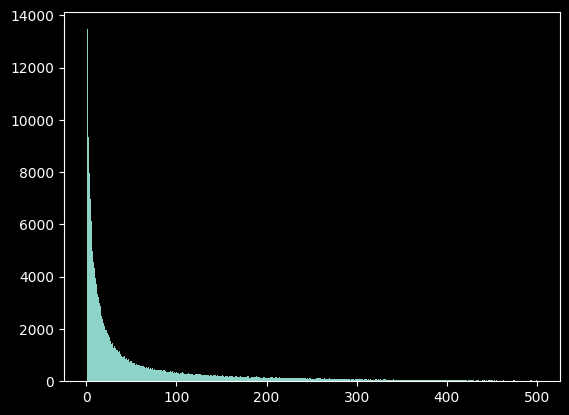

In [37]:
plt.hist(vizgen_scdata.obs['total_counts'], bins = 500, range = (0,500))

### Run cell filtering

In [39]:
vizgen_scdata

AnnData object with n_obs × n_vars = 199644 × 135
    obs: 'total_counts', 'n_genes', 'area', 'volume', 'Sample ID'
    obsm: 'X_spatial', 'X_raw'

In [38]:
vizgen_scdata_filtered = vizgen_scdata[vizgen_scdata.obs['total_counts'] >= 5]
vizgen_scdata_filtered = vizgen_scdata_filtered[vizgen_scdata_filtered.obs['total_counts'] <= 500]
vizgen_scdata_filtered

View of AnnData object with n_obs × n_vars = 159062 × 135
    obs: 'total_counts', 'n_genes', 'area', 'volume', 'Sample ID'
    obsm: 'X_spatial', 'X_raw'

### Generate Umap

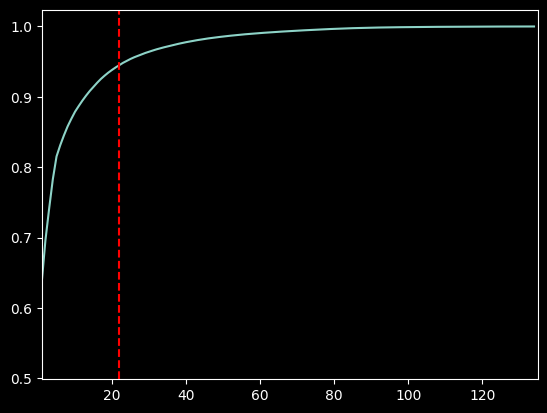

In [40]:
# find elbow point for optimal number of dimensions
#!pip install kneed
dimred = PCA()
dimred.fit(vizgen_scdata_filtered.X)
sns.lineplot(np.cumsum(dimred.explained_variance_ratio_))
location = KneeLocator(range(1, len(dimred.explained_variance_ratio_) + 1),
                       np.cumsum(dimred.explained_variance_ratio_),
                       curve="concave", direction="increasing")
plt.axvline(location.elbow, color="red", linestyle="--")
plt.xlim((1, 135));

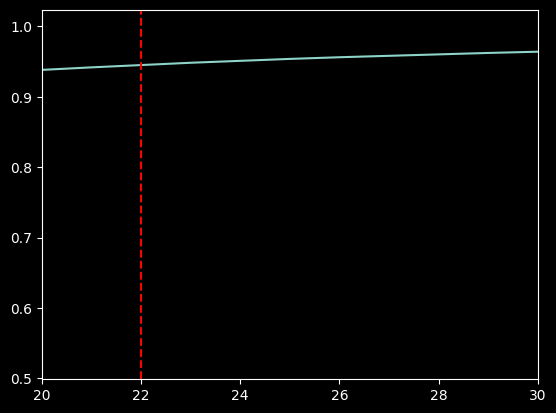

In [41]:
sns.lineplot(np.cumsum(dimred.explained_variance_ratio_))
location = KneeLocator(range(1, len(dimred.explained_variance_ratio_) + 1),
                       np.cumsum(dimred.explained_variance_ratio_),
                       curve="concave", direction="increasing")
plt.axvline(location.elbow, color="red", linestyle="--")
plt.xlim((20, 30));

In [47]:
sc.pp.log1p(vizgen_scdata_filtered)
sc.pp.normalize_total(vizgen_scdata_filtered)
sc.pp.scale(vizgen_scdata_filtered)
sc.pp.pca(vizgen_scdata_filtered, n_comps = 22, random_state = 42)
umap_operator = umap.UMAP(n_components = 2, random_state = 42, metric = 'euclidean', min_dist = 0.01)
umap_result_vizgen = umap_operator.fit_transform(vizgen_scdata_filtered.obsm['X_pca'])
vizgen_scdata_filtered.obsm['X_umap'] = umap_result_vizgen

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [48]:
sc.pp.neighbors(vizgen_scdata_filtered, use_rep = 'X_umap', n_neighbors = 40)

In [51]:
sc.tl.leiden(vizgen_scdata_filtered, resolution = 0.01)

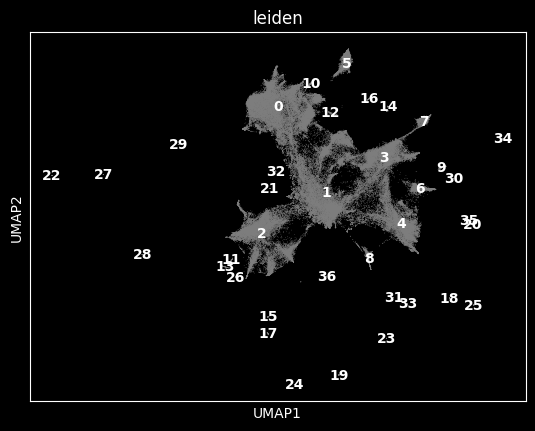

In [52]:
sc.pl.umap(vizgen_scdata_filtered, color = 'leiden', legend_loc = 'on data')

In [62]:
vizgen_scdata_filtered.obs['leiden'].value_counts()

0     43808
1     37887
2     25594
3     19955
4     17242
5      4749
6      3626
7      2497
8      1617
9       428
10      282
11      240
12      142
13      141
14      121
15       84
16       79
17       73
18       60
19       58
20       43
21       35
22       34
23       31
24       27
25       25
26       24
27       23
28       22
29       19
30       16
31       16
32       15
33       15
34       15
35       11
36        8
Name: leiden, dtype: int64

In [63]:
clusters_to_remove = ['29', '30', '31', '32', '33', '34', '35', '36']

In [66]:
vizgen_scdata_filtered1 = vizgen_scdata_filtered[~vizgen_scdata_filtered.obs['leiden'].isin(clusters_to_remove)]
vizgen_scdata_filtered1

View of AnnData object with n_obs × n_vars = 158947 × 135
    obs: 'total_counts', 'n_genes', 'area', 'volume', 'Sample ID', 'leiden'
    var: 'mean', 'std'
    uns: 'pca', 'neighbors', 'leiden', 'log1p'
    obsm: 'X_spatial', 'X_raw', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [83]:
sc.tl.leiden(vizgen_scdata_filtered1, resolution = 0.05)

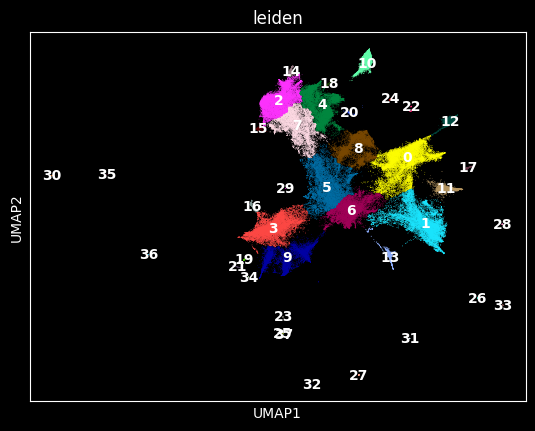

In [84]:
sc.pl.umap(vizgen_scdata_filtered1, color = 'leiden', legend_loc = 'on data')

In [85]:
vizgen_scdata_filtered1

AnnData object with n_obs × n_vars = 158947 × 135
    obs: 'total_counts', 'n_genes', 'area', 'volume', 'Sample ID', 'leiden'
    var: 'mean', 'std'
    uns: 'pca', 'neighbors', 'leiden', 'log1p', 'leiden_colors'
    obsm: 'X_spatial', 'X_raw', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

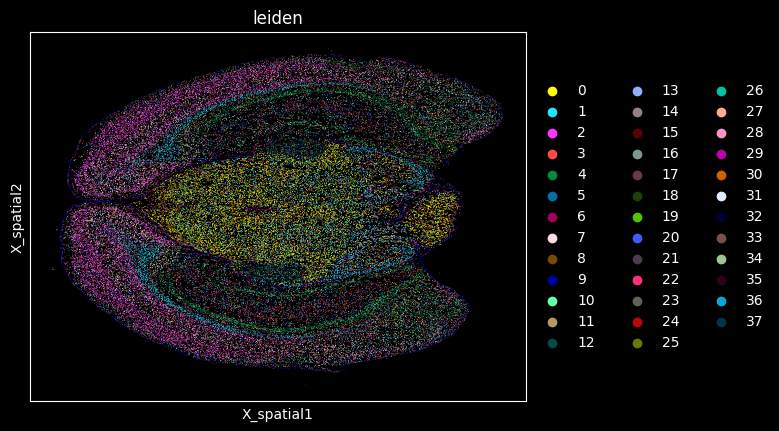

In [86]:
sc.pl.embedding(vizgen_scdata_filtered1, basis = 'X_spatial', color = 'leiden')

In [92]:
leiden_list = list(vizgen_scdata_filtered1.obs['leiden'].unique())
leiden_list

['5',
 '6',
 '10',
 '8',
 '11',
 '3',
 '1',
 '9',
 '21',
 '16',
 '18',
 '13',
 '25',
 '4',
 '2',
 '7',
 '0',
 '34',
 '17',
 '22',
 '12',
 '14',
 '20',
 '33',
 '35',
 '30',
 '23',
 '36',
 '28',
 '15',
 '24',
 '26',
 '37',
 '19',
 '29',
 '32',
 '27',
 '31']

### Cell type labeling

In [87]:
color_palette = {
    "0": "#0e6389",
        "1": "#815d58",
        "2": "#7e9875",
        "3": "#77e07c",
        "4": "#2e9dfc",
        "5": "#ec1725",
        "6": "#f17194",
        "7": "#ea65cd",
        "8": "#b69f13",
        "9": "#c0b4f7",
        "10": "#4217d9",
        "11": "#54d7a4",
        "12": "#de0184",
        "13": "#0000FF",
        "14": "#22d81e",
        "15": "#584ffd",
        "16": "#81d86e",
        "17": "#1c9111",
        "18": "#6ebd17",
        "19": "#ce2f35",
        "20": "#6ba7f0",
        "21": "#5b3b19",
        "22": "#91ea55",
        "23": "#5e1efb",
        "24": "#19af06",
        "25": "#86f8d4",
        "26": "#ca8d02",
        "27": "#cb496f",
        "28": "#c02b14",
        "29": "#6752db",
        "30": "#c14b0c",
        "31": "#ec191a",
        "32": "#f4368f",
        "33": "#76e3fb",
        "34": "#4c8bb2",
        "35": "#5b5358",
        "36": "#846b24",
        "37": "#7c1851",
        "38": "#3482f2"
}

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


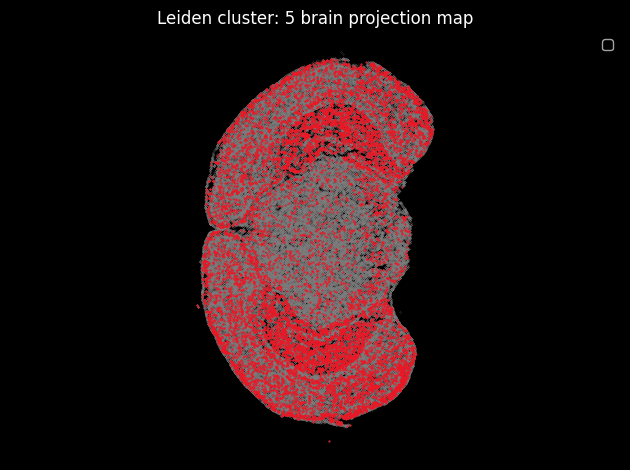

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


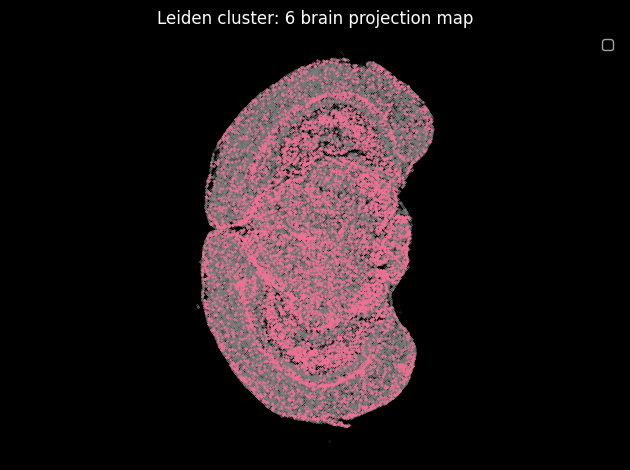

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


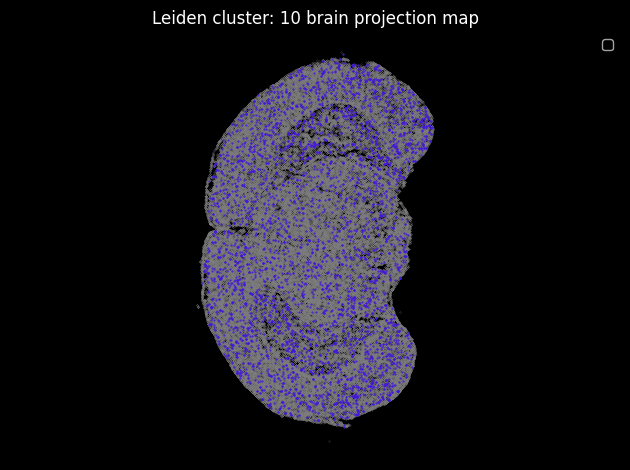

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


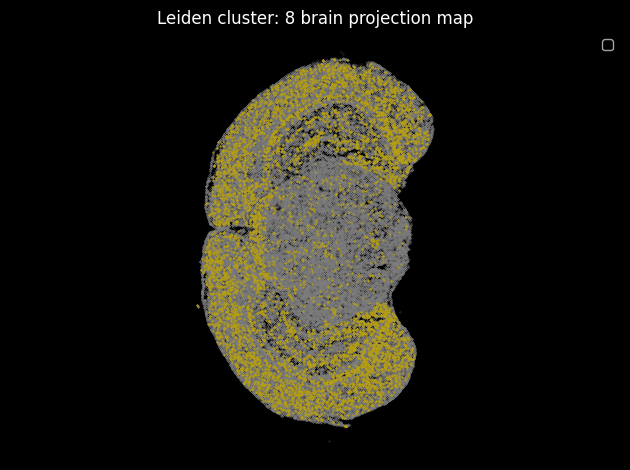

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


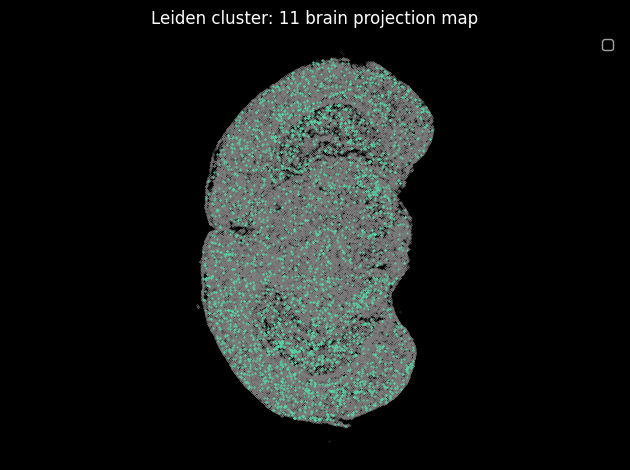

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


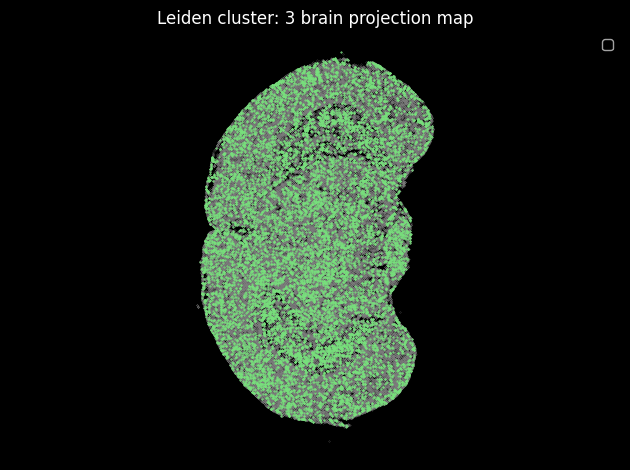

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


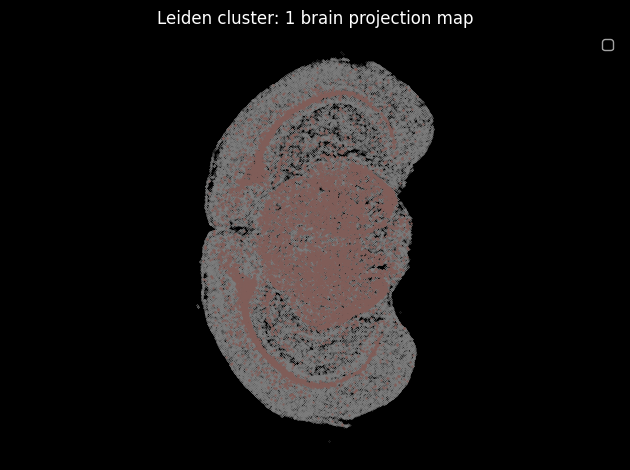

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


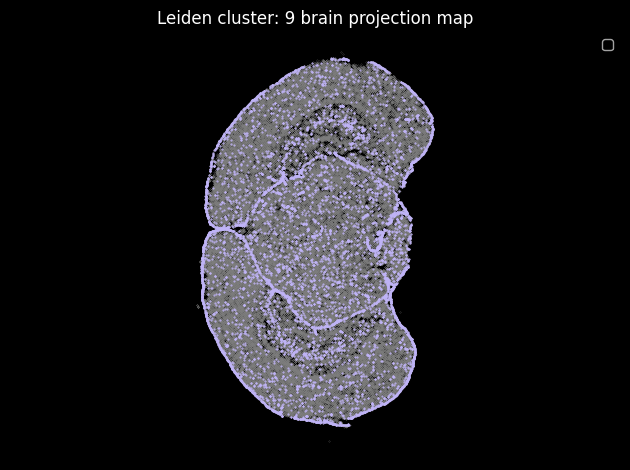

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


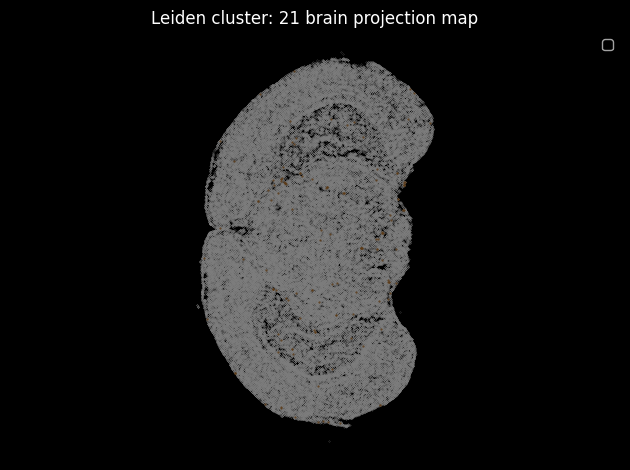

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


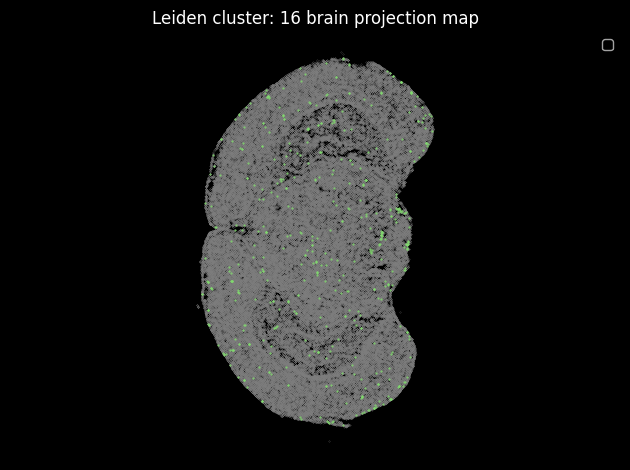

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


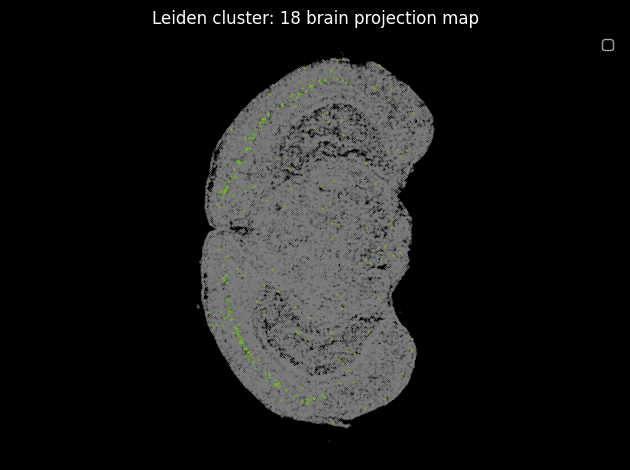

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


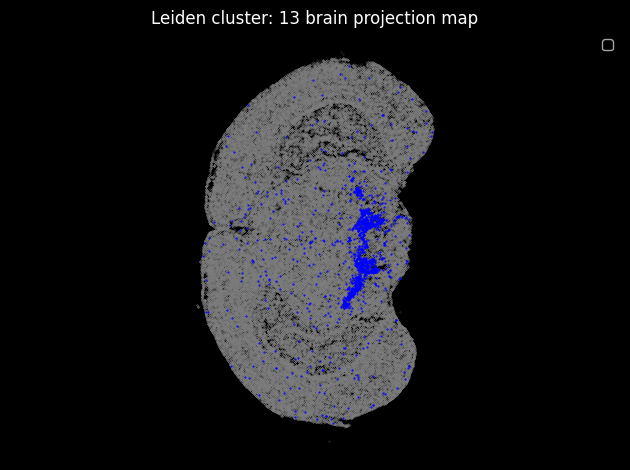

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


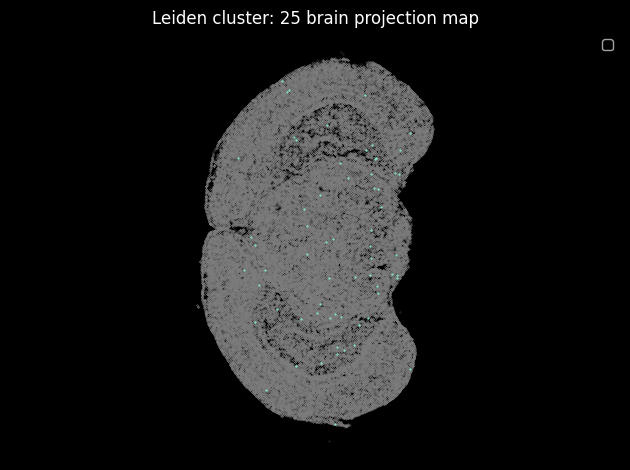

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


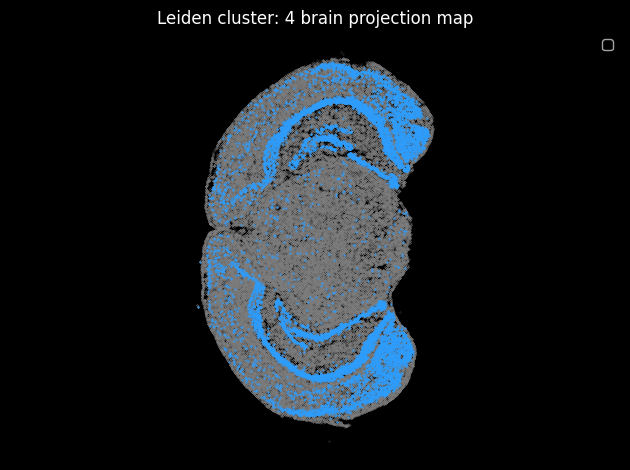

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


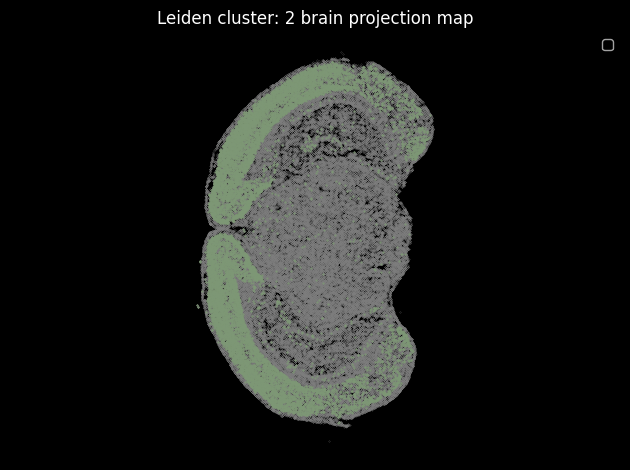

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


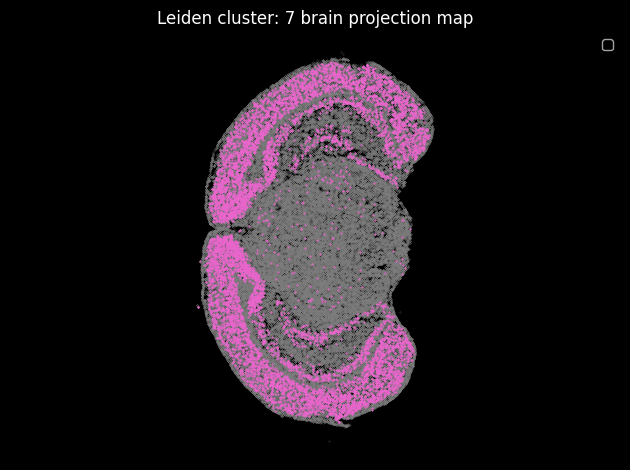

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


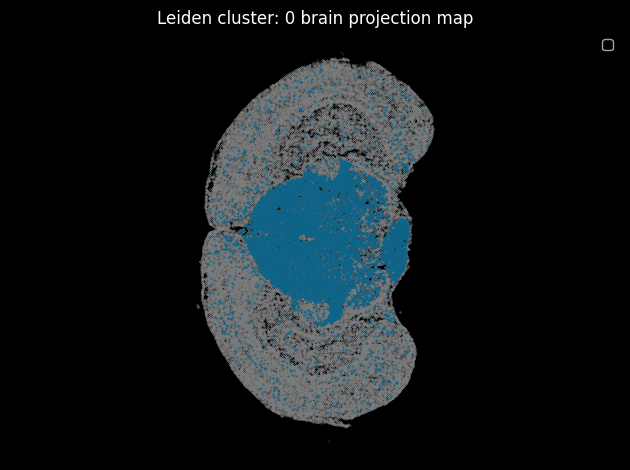

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


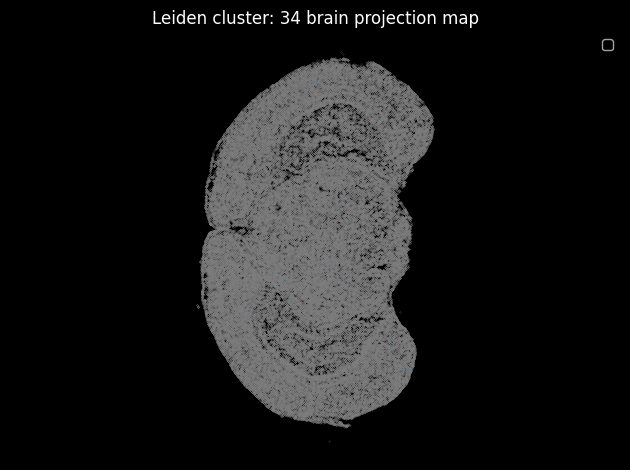

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


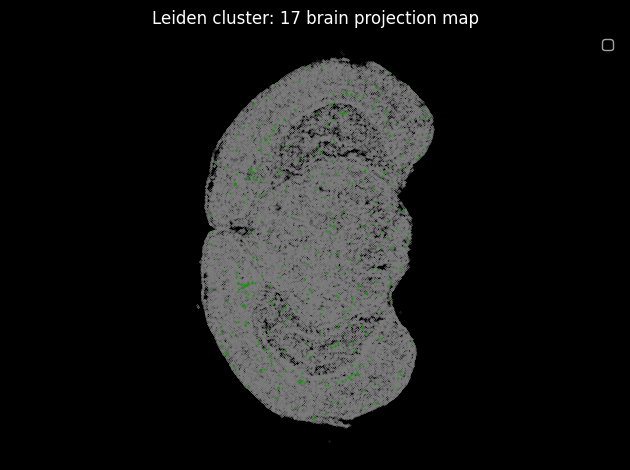

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


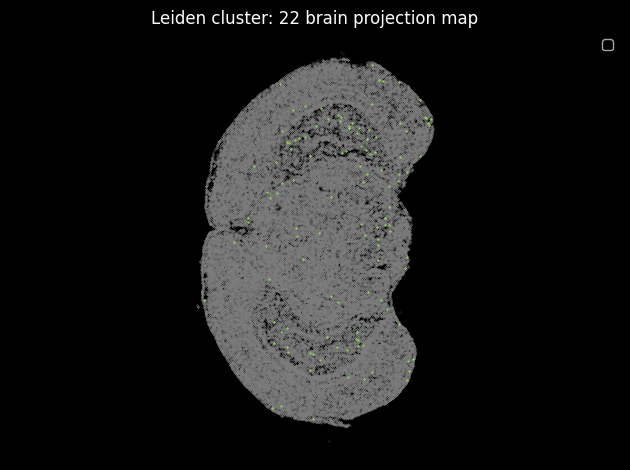

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


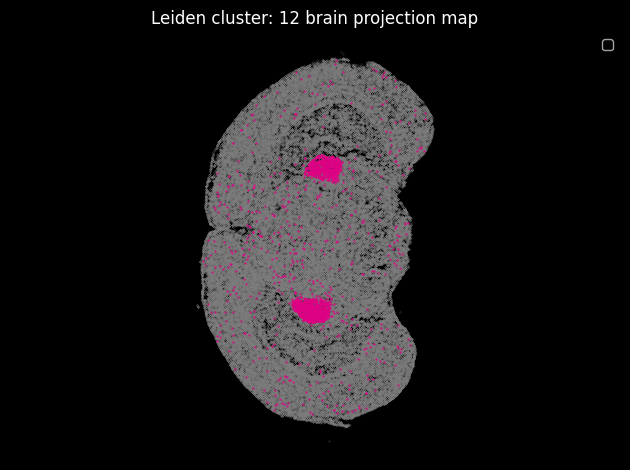

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


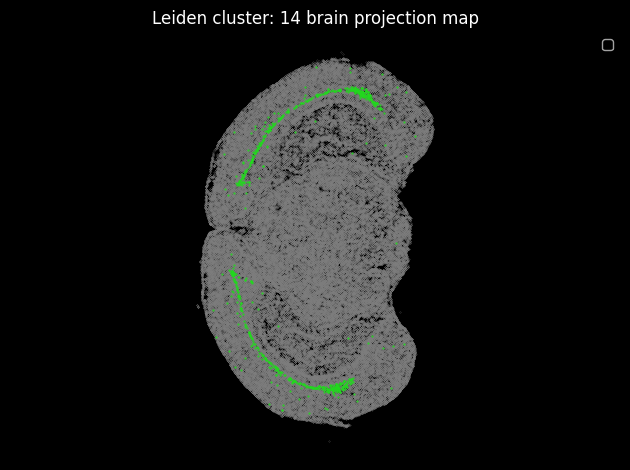

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


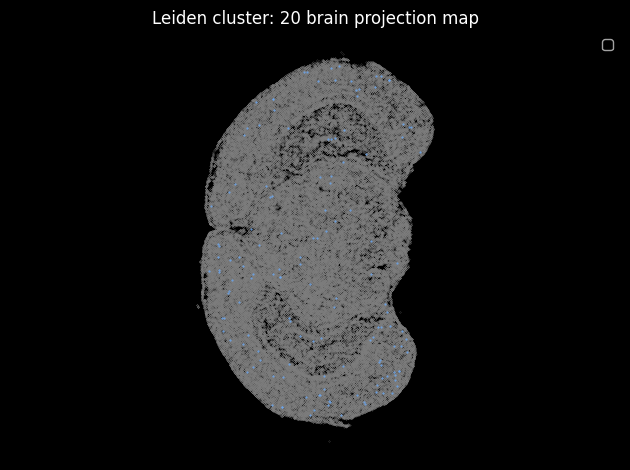

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


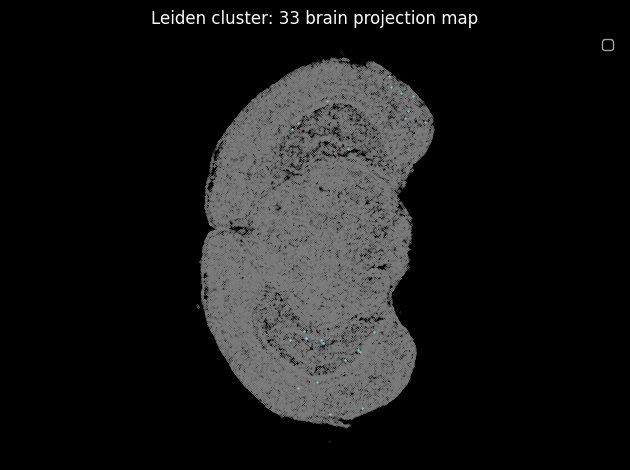

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


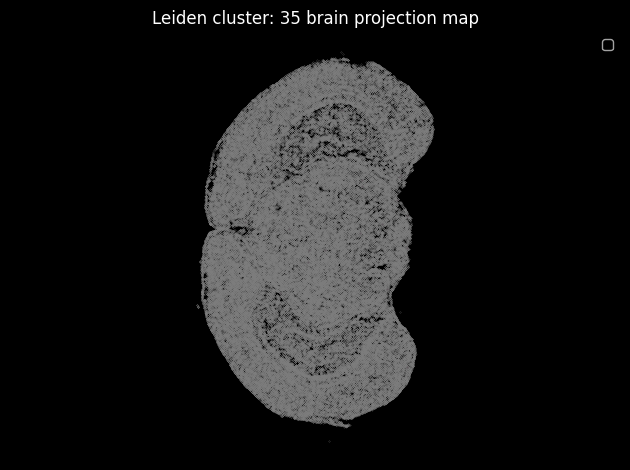

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


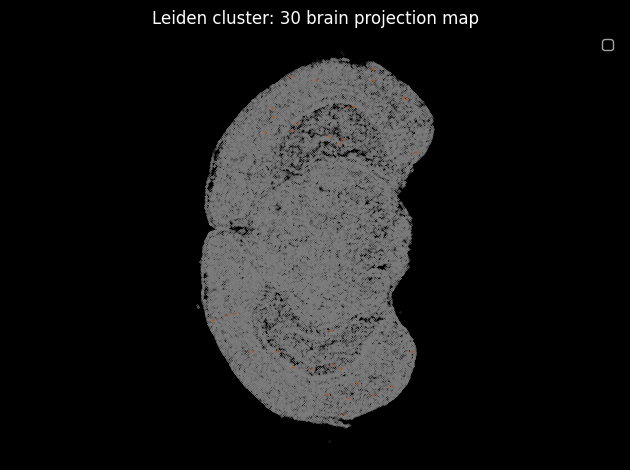

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


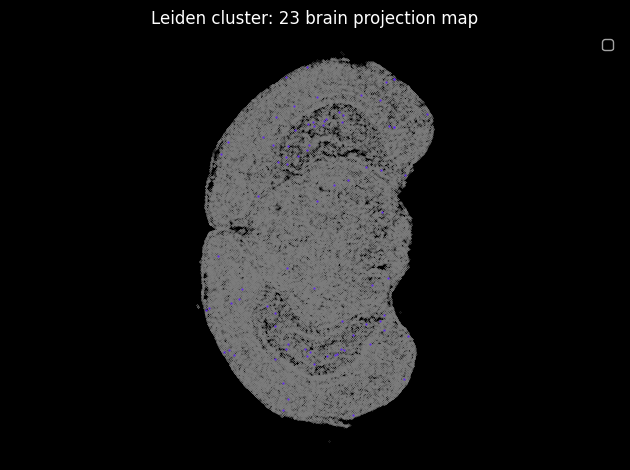

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


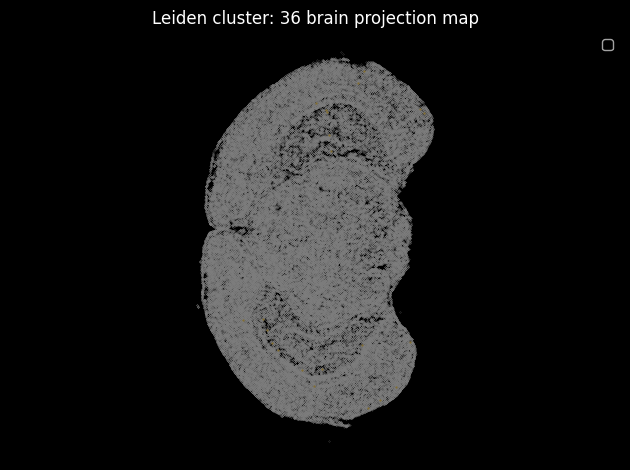

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


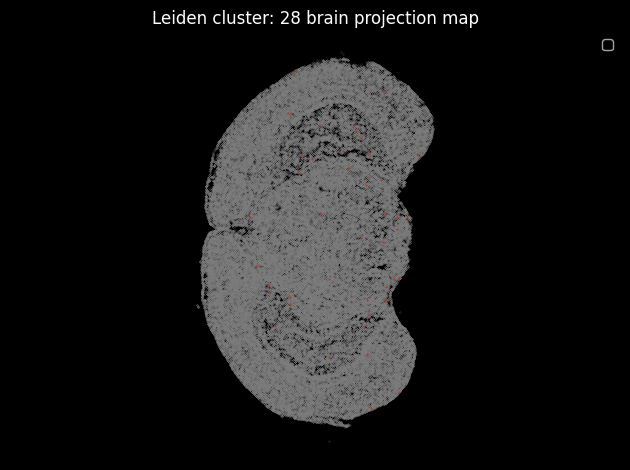

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


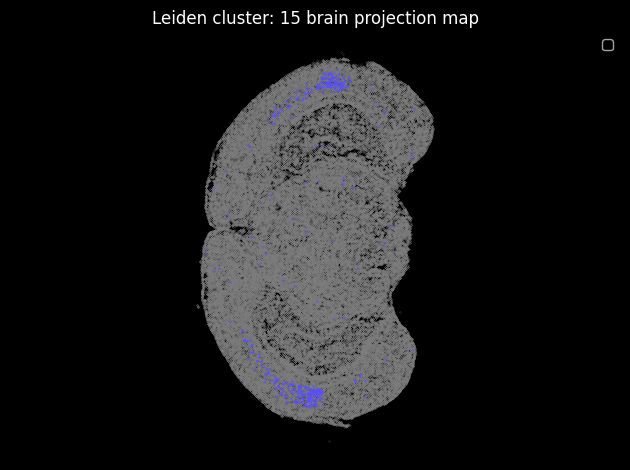

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


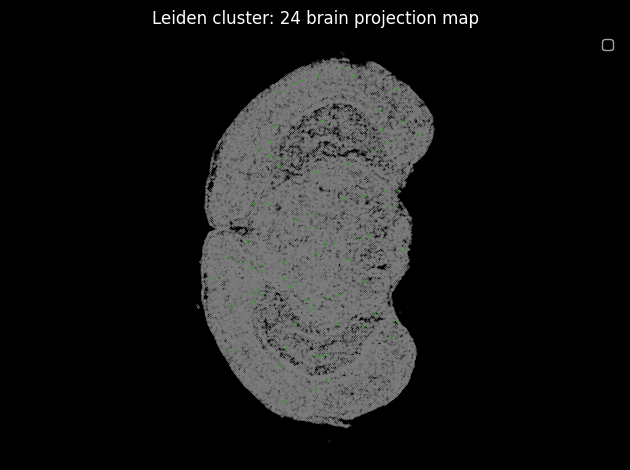

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


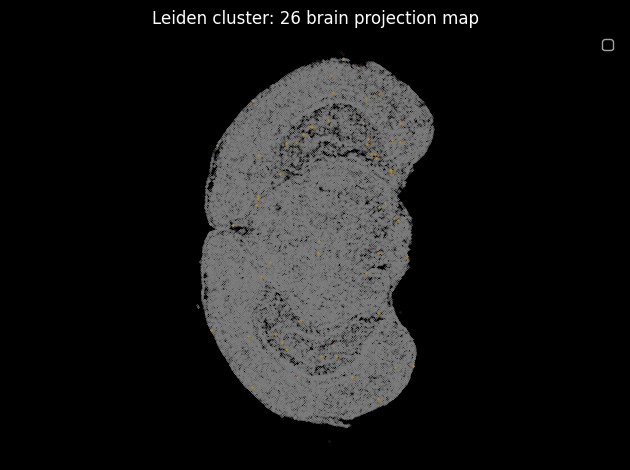

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


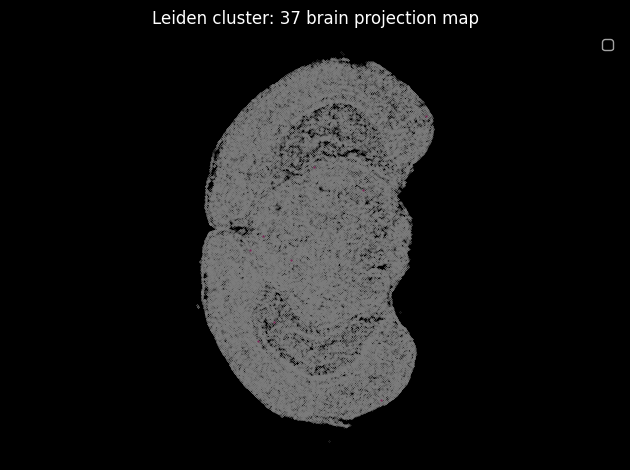

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


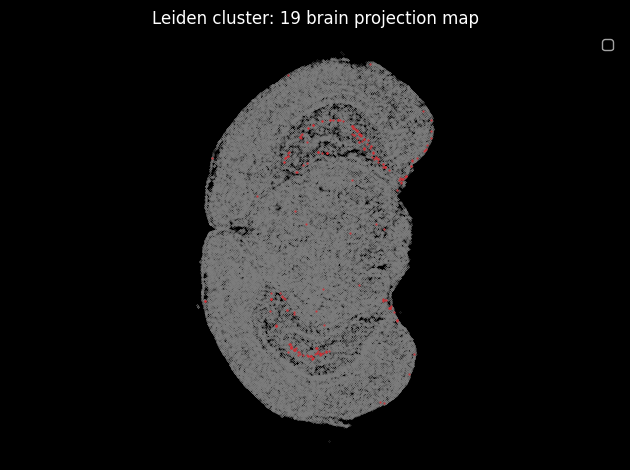

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


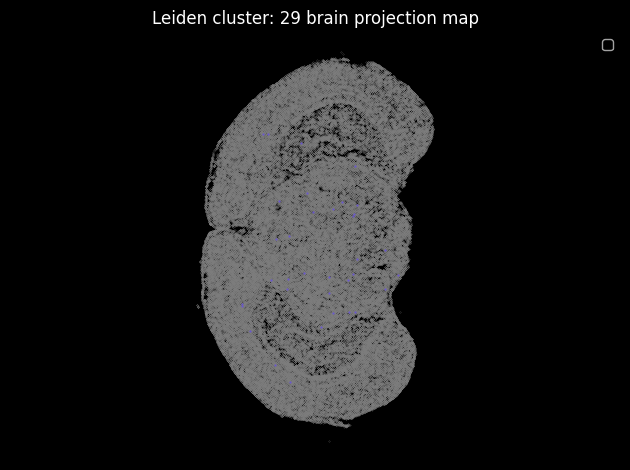

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


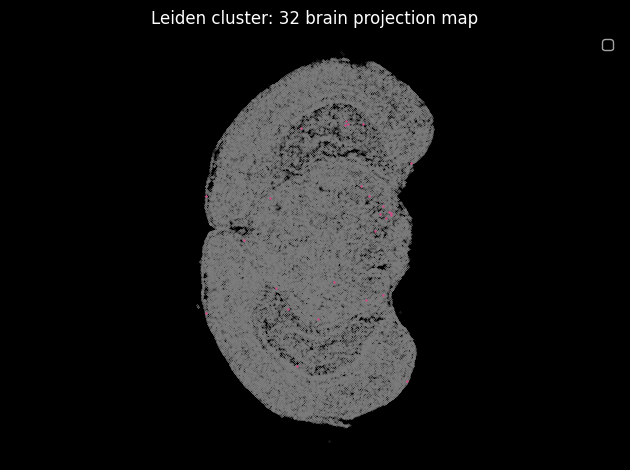

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


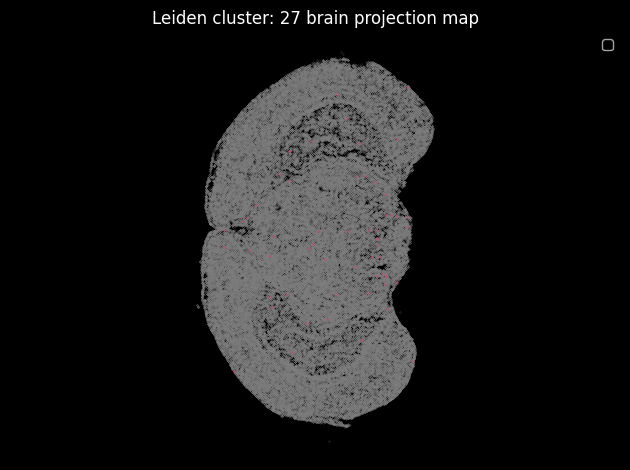

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


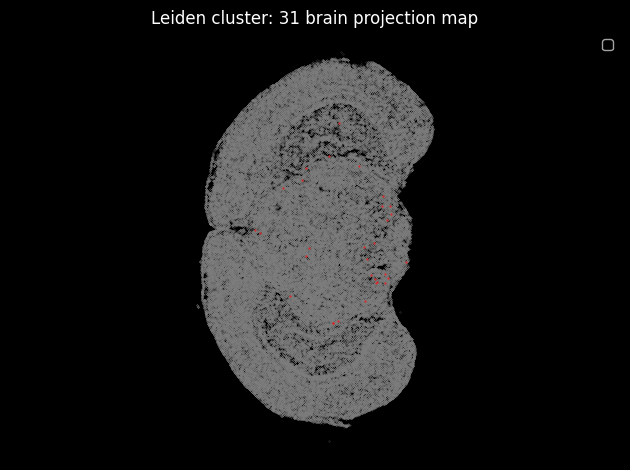

In [93]:
# generate brain projection map projecting the spatial location of each cluster
# this will aid in labeling the cell types of each cluster
for cluster in leiden_list:
    plt.scatter(vizgen_scdata_filtered1.obsm['X_spatial'][:,0], vizgen_scdata_filtered1.obsm['X_spatial'][:,1], c = 'gray', s = 0.1, marker = '.')
    inds = vizgen_scdata_filtered1.obs['leiden'] == cluster
    x = vizgen_scdata_filtered1.obsm['X_spatial'][:,0][inds]
    y = vizgen_scdata_filtered1.obsm['X_spatial'][:,1][inds]
    # col = cmap[int(cluster) % len(cmap)]
    palette = color_palette[cluster]
    plt.scatter(x, y, s=1, marker='.', c = palette)
    plt.title(f'Leiden cluster: {cluster} brain projection map')
    plt.axis("off")
    plt.axis("equal")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [94]:
sc.tl.rank_genes_groups(vizgen_scdata_filtered1, groupby='leiden')

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:455: RuntimeWarning: inv

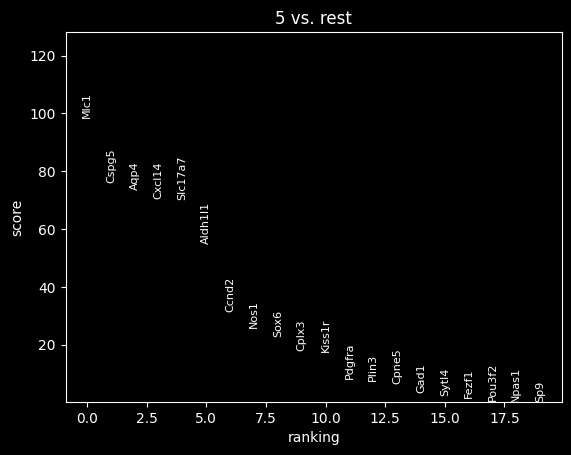

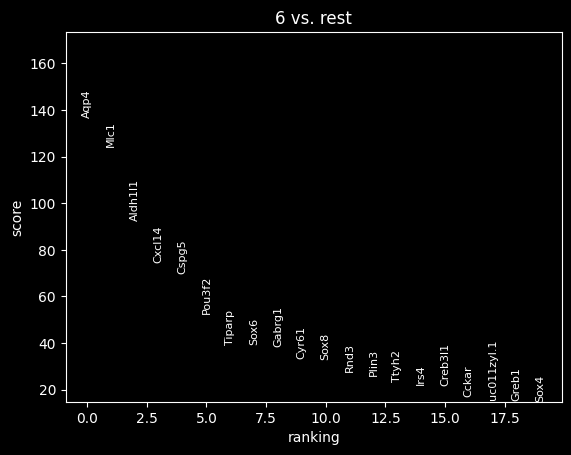

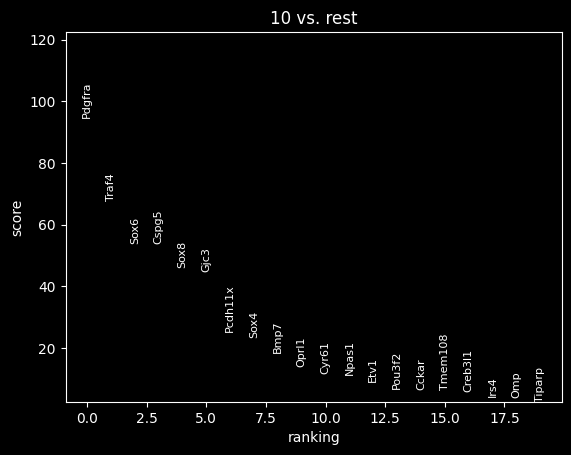

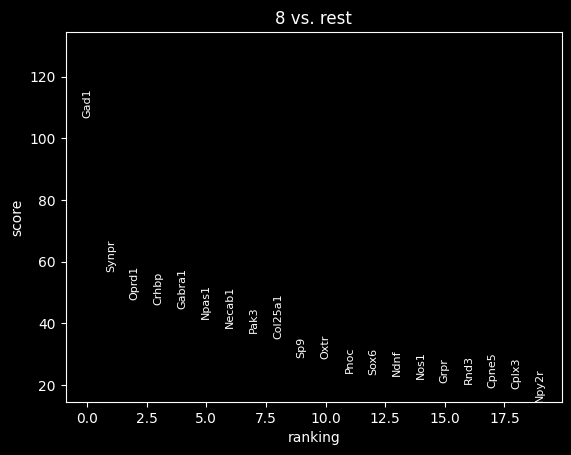

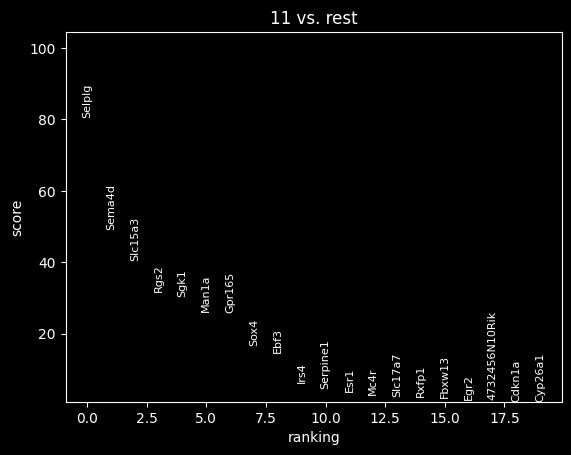

...

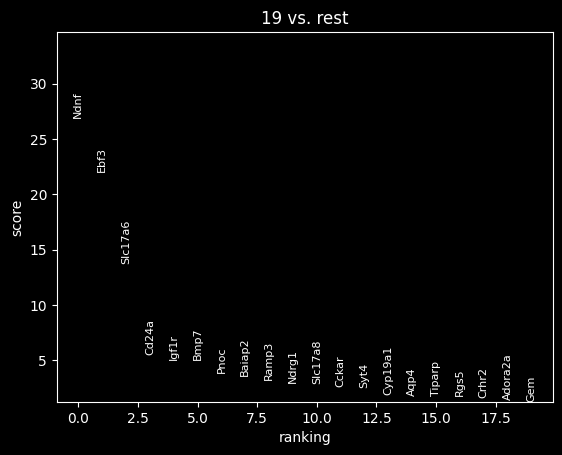

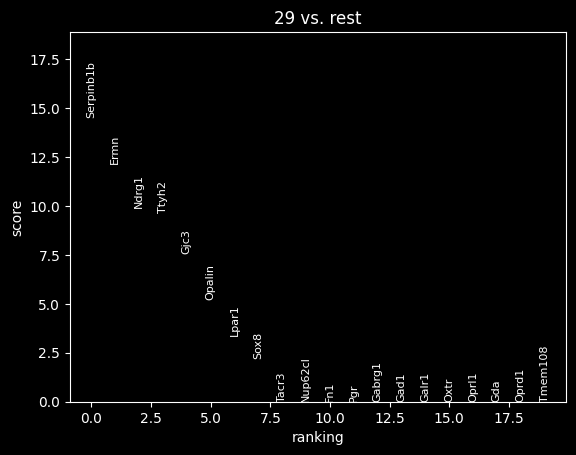

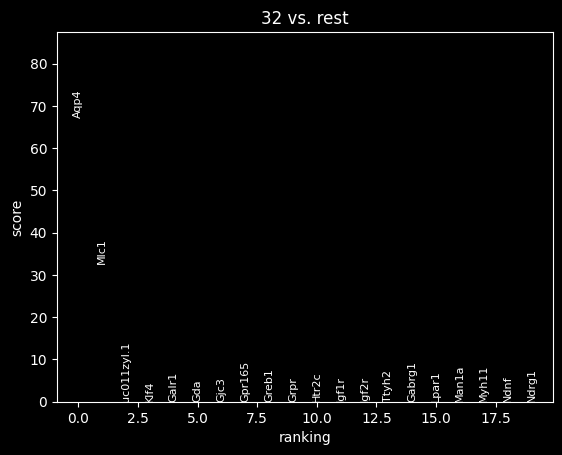

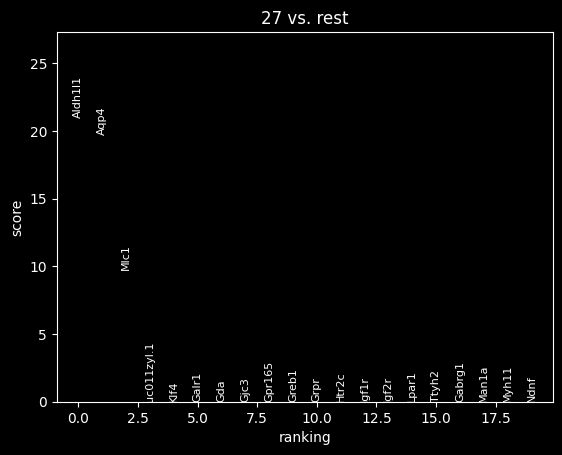

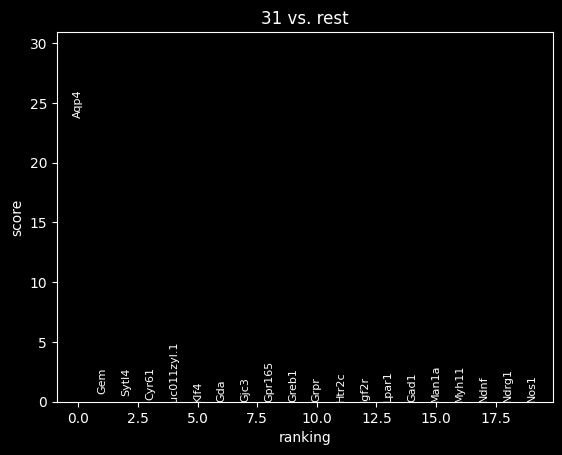

In [95]:
for leiden in leiden_list:
    sc.pl.rank_genes_groups(vizgen_scdata_filtered1, groups=[leiden])

In [96]:
clusters_to_remove = ['27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38']

In [98]:
vizgen_scdata_filtered2 = vizgen_scdata_filtered1[~vizgen_scdata_filtered1.obs['leiden'].isin(clusters_to_remove)]
vizgen_scdata_filtered2

View of AnnData object with n_obs × n_vars = 158616 × 135
    obs: 'total_counts', 'n_genes', 'area', 'volume', 'Sample ID', 'leiden'
    var: 'mean', 'std'
    uns: 'pca', 'neighbors', 'leiden', 'log1p', 'rank_genes_groups'
    obsm: 'X_spatial', 'X_raw', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


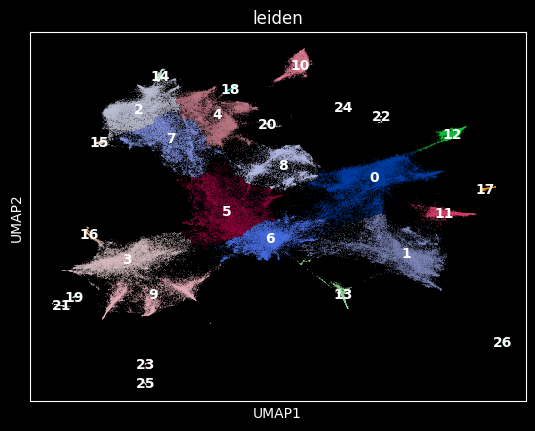

In [99]:
sc.pl.umap(vizgen_scdata_filtered2, color = 'leiden', legend_loc = 'on data')

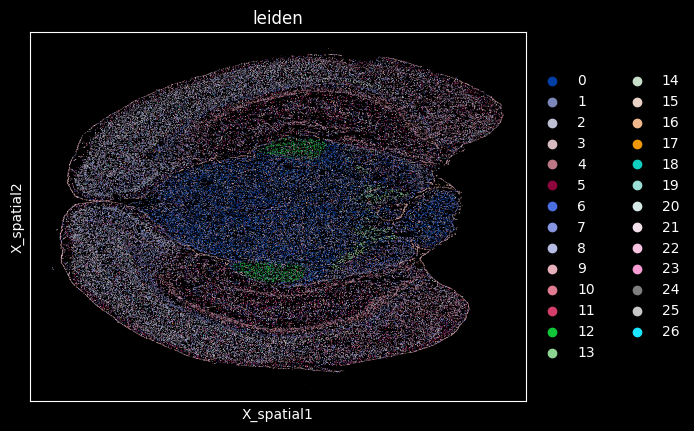

In [100]:
sc.pl.embedding(vizgen_scdata_filtered2, color = 'leiden', basis = 'X_spatial')

In [101]:
vizgen_scdata_filtered2.write(r'D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Vizgen Analysis\vizgen_scdata_filtered.h5ad')